In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
df=pd.read_csv('train.csv')

#to understand the dataset
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [2]:
print(df.isnull().sum())


Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64


In [3]:
df.drop('Id', axis=1, inplace=True)

In [4]:
df.shape

(1460, 80)

In [5]:

missing_values = df.isnull().sum()
missing_columns = missing_values[missing_values > 0]

print("Columns with missing values and their counts:")
print(missing_columns)

Columns with missing values and their counts:
LotFrontage      259
Alley           1369
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In [6]:
df['MSZoning'].isnull().sum()

0

In [7]:
df.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [8]:
df['Alley'].unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

In [9]:
#first handling missing values in alley. nan alley could actually mean that property has no alley access. so fill missing values as no alley.
df['Alley'] = df['Alley'].fillna('NoAlley')

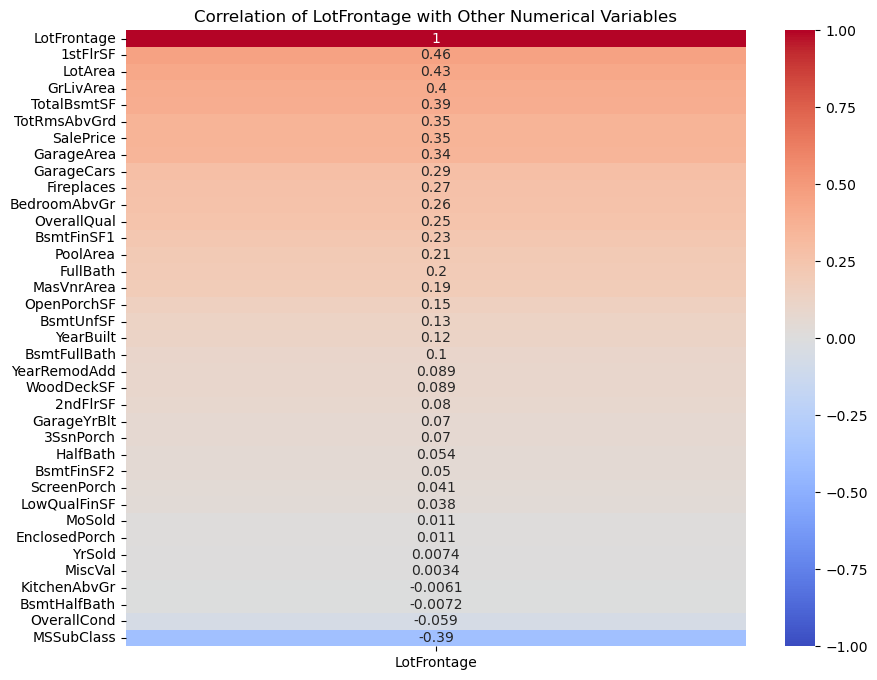

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numerical columns
numerical_cols = df.select_dtypes(include=['number']).columns

# Calculate the correlation matrix for numerical columns
correlation_matrix = df[numerical_cols].corr()

# Visualize the correlation of LotFrontage with other numerical variables
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[['LotFrontage']].sort_values(by='LotFrontage', ascending=False), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of LotFrontage with Other Numerical Variables')
plt.show()


In [11]:

from scipy.stats import chi2_contingency
#Check correlation between LotFrontage and other categorical variables
# Function to calculate Cramér's V
def cramers_v(x, y):
    contingency_table = pd.crosstab(x, y)
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    n = contingency_table.sum().sum()
    return np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1)))

# Select categorical columns (object and category types)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns

# Calculate and print Cramér's V for LotFrontage vs each categorical feature
for feature in categorical_cols:
    # Check if the feature has a significant amount of data and non-null values
    if df[feature].notnull().sum() > 0: 
        v = cramers_v(df['LotFrontage'], df[feature])
        print(f"Cramér's V between LotFrontage and {feature}: {v}")


Cramér's V between LotFrontage and MSZoning: 0.4198499758235462
Cramér's V between LotFrontage and Street: 0.3291931973867167
Cramér's V between LotFrontage and Alley: 0.430424353000994
Cramér's V between LotFrontage and LotShape: 0.5731110933550451
Cramér's V between LotFrontage and LandContour: 0.3660102551978236
Cramér's V between LotFrontage and Utilities: nan
Cramér's V between LotFrontage and LotConfig: 0.4187636214555456
Cramér's V between LotFrontage and LandSlope: 0.40984579249948316
Cramér's V between LotFrontage and Neighborhood: 0.4603179149759649
Cramér's V between LotFrontage and Condition1: 0.3659804511416103
Cramér's V between LotFrontage and Condition2: 0.37297441513925816
Cramér's V between LotFrontage and BldgType: 0.5743368533705681
Cramér's V between LotFrontage and HouseStyle: 0.3260293111659927
Cramér's V between LotFrontage and RoofStyle: 0.30678175379295314
Cramér's V between LotFrontage and RoofMatl: 0.4283958249742827
Cramér's V between LotFrontage and Exteri

/var/folders/nv/6d5h7k411n9gxsh8b572cpf80000gn/T/ipykernel_26930/2032784412.py:8: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1)))


In [12]:

# Fill missing values in 'PoolQC' with 'NoPool'
df['PoolQC'] = df['PoolQC'].fillna('NoPool')

In [13]:
# Impute missing values in 'LotFrontage' by grouping based on 'PoolQC', 'BldgType', 'LotShape', and 'LotArea' 
#since these variables have better correlation between them
# Compute the global median for LotFrontage as a fallback
global_median = df['LotFrontage'].median()

# Fill missing values group-wise, and use global median if group median is NaN
df['LotFrontage'] = df.groupby(['PoolQC', 'BldgType', 'LotShape'])['LotFrontage'].transform(
    lambda x: x.fillna(x.median() if not x.median() != x.median() else global_median)
)



In [14]:

# Assuming your DataFrame is named df
missing_values = df.isnull().sum()
missing_columns = missing_values[missing_values > 0]

print("Columns with missing values and their counts:")
print(missing_columns)


Columns with missing values and their counts:
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
Fence           1179
MiscFeature     1406
dtype: int64


In [15]:

# Loop through each column and fill missing values if missing count is < 3
for col in df.columns:
    if df[col].isnull().sum() > 0 and df[col].isnull().sum() < 3:
        print(f"{col}: {df[col].isnull().sum()} missing being replaced with mode or median")
        if df[col].dtype in ['object', 'category']:  # Categorical
            df[col] = df[col].fillna(df[col].mode()[0])
        else:  # Numerical
            df[col] = df[col].fillna(df[col].median())

        

Electrical: 1 missing being replaced with mode or median


In [16]:
# Assuming your DataFrame is named df
missing_values = df.isnull().sum()
missing_columns = missing_values[missing_values > 0]

print("Columns with missing values and their counts:")
print(missing_columns)


Columns with missing values and their counts:
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
Fence           1179
MiscFeature     1406
dtype: int64


In [17]:
'''MasVnrType stands for Masonry Veneer Type, which describes the type of masonry veneer used on the exterior of the house.'''
#masvnrtype being NaN could simply mean that there is no masonry veneer used in the house.
# to check we can see if masvnrarea for such nan values is 0. if so, we can simply fillna with "none"
df[df['MasVnrType'].isnull()][['MasVnrType', 'MasVnrArea']]

,MasVnrType,MasVnrArea
1,NaN,0.0
3,NaN,0.0
5,NaN,0.0
8,NaN,0.0
9,NaN,0.0
...,...,...
1454,NaN,0.0
1455,NaN,0.0
1457,NaN,0.0
1458,NaN,0.0


In [18]:
# Find rows where MasVnrType is missing but MasVnrArea is not zero or missing
mask = df['MasVnrType'].isnull() & (df['MasVnrArea'].fillna(0) != 0)
df[['MasVnrType', 'MasVnrArea']][mask]

,MasVnrType,MasVnrArea
624,NaN,288.0
773,NaN,1.0
1230,NaN,1.0
1300,NaN,344.0
1334,NaN,312.0


In [19]:
df[df['MasVnrArea'] > 0]['MasVnrType'].value_counts() # to check Check most common MasVnrType where area > 0


MasVnrType
BrkFace    444
Stone      127
BrkCmn      15
Name: count, dtype: int64

In [20]:
# Step 1: Fill 'MasVnrType' with 'None' where 'MasVnrArea' is 0
df.loc[(df['MasVnrType'].isnull()) & (df['MasVnrArea'] == 0), 'MasVnrType'] = 'None'

# Step 2: Fill remaining missing 'MasVnrType' values with the mode
mode_type = df['MasVnrType'].mode()[0]
df['MasVnrType'] = df['MasVnrType'].fillna(mode_type)


In [21]:

# Filter rows where 'MasVnrArea' is NaN and print 'MasVnrType' for those rows
print(df[df['MasVnrArea'].isna()][['MasVnrType', 'MasVnrArea']])

     MasVnrType  MasVnrArea
234        None         NaN
529        None         NaN
650        None         NaN
936        None         NaN
973        None         NaN
977        None         NaN
1243       None         NaN
1278       None         NaN


In [22]:
# this means that some entries of MasVnrArea is entered as NaN because there were no Masonry veneer so can be filled with 0
df['MasVnrArea']=df['MasVnrArea'].fillna(0)

In [23]:

# Assuming your DataFrame is named df
missing_values = df.isnull().sum()
missing_columns = missing_values[missing_values > 0]

print("Columns with missing values and their counts:")
print(missing_columns)


Columns with missing values and their counts:
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
Fence           1179
MiscFeature     1406
dtype: int64


In [24]:
basement_cols = ['BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'BsmtCond', 'BsmtQual']
# all these features are related to basement. seeing that all of them have similar missing values. it could mean they have no basement in that property
#so lets print the rows where all 5 of them are nan, then we can just replace them with noBasement as a value
df[df[basement_cols].isna().all(axis=1)][basement_cols]


,BsmtFinType1,BsmtFinType2,BsmtExposure,BsmtCond,BsmtQual
17,NaN,NaN,NaN,NaN,NaN
39,NaN,NaN,NaN,NaN,NaN
90,NaN,NaN,NaN,NaN,NaN
102,NaN,NaN,NaN,NaN,NaN
156,NaN,NaN,NaN,NaN,NaN
182,NaN,NaN,NaN,NaN,NaN
259,NaN,NaN,NaN,NaN,NaN
342,NaN,NaN,NaN,NaN,NaN
362,NaN,NaN,NaN,NaN,NaN
371,NaN,NaN,NaN,NaN,NaN


In [25]:
#if we notice , apart from the nobasement intuition , there are some features that have genuine missing values.
#for instance bsmtfintype1 has 37issing values while bsmtfintype2 has 38ie that could be a actual missing value even though basement is present in that property.
#likewise, bsmtexposure,bsmtcond has 2extra missing values while bsmtqual has 37
#code to print the 5 features where not all of them arent nan but atleast one of them is nan.

basement_cols = ['BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'BsmtCond', 'BsmtQual']

# Rows with at least one missing in basement features
missing_some_basement = df[basement_cols].isna().any(axis=1)

# But not all missing
not_all_missing = ~df[basement_cols].isna().all(axis=1)

# Combine both conditions
odd_rows = df[missing_some_basement & not_all_missing][basement_cols]

print(odd_rows)



    BsmtFinType1 BsmtFinType2 BsmtExposure BsmtCond BsmtQual
332          GLQ          NaN           No       TA       Gd
948          Unf          Unf          NaN       TA       Gd


In [26]:
#firstly handling the missing values where all the basement related features are nan which means the property has nobasement.
#so 37 rows of all these 5 features will be filled with "noBasement"
basement_cols = ['BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'BsmtCond', 'BsmtQual']
# Identify rows where all basement-related features are NaN
all_missing = df[basement_cols].isna().all(axis=1)

# Fill those rows with 'NoBasement'
df.loc[all_missing, basement_cols] = df.loc[all_missing, basement_cols].fillna('NoBasement')

In [27]:
#nextly we need to handle remaining missing values in each of the basement features 
basement_cols = ['BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'BsmtCond', 'BsmtQual']
print(df[basement_cols].isna().sum())

BsmtFinType1    0
BsmtFinType2    1
BsmtExposure    1
BsmtCond        0
BsmtQual        0
dtype: int64


In [28]:
from scipy.stats import mode
#what this code does is that bsmtfintype2 has 1 missing value right,
#  it groups the rows based on bsmtfintype1, bsmtexposure, bsmtcond and bsmtqual and then replaces the nan with mode of that group.
# same is repeated for bsmtexposure and rest of basement related feature missing values.
#this kind of imputation makes more sense and could be more accurate than just imputing global mode of that column


# Function to fill missing values with mode, grouped by other columns
def fillna_with_group_mode(df, target_col, group_cols):
    # Apply only to missing values
    mask = df[target_col].isna()
    
    # Group by the columns and get the mode for each group
    grouped = df.groupby(group_cols)[target_col].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
    
    # Apply the grouped mode to the missing values
    df.loc[mask, target_col] = df.loc[mask, group_cols].apply(lambda row: grouped.get(tuple(row), df[target_col].mode()[0]), axis=1)

# List of basement features
basement_cols_with_na = ['BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'BsmtCond', 'BsmtQual']

# Fill each column using mode grouped by other available basement features
for target_col in basement_cols_with_na:
    group_cols = [col for col in basement_cols_with_na + ['BsmtFinType1'] if col != target_col]
    fillna_with_group_mode(df, target_col, group_cols)


In [29]:

# Assuming your DataFrame is named df
missing_values = df.isnull().sum()
missing_columns = missing_values[missing_values > 0]

print("Columns with missing values and their counts:")
print(missing_columns)

Columns with missing values and their counts:
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
Fence           1179
MiscFeature     1406
dtype: int64


In [30]:
# similar to basement related features we have Garage related features missing. so lets use the same intuition used for basement features
garage_cols = ['GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond']

# Print rows where all garage-related features are null
print(df[df[garage_cols].isna().all(axis=1)][garage_cols])

     GarageType  GarageYrBlt GarageFinish GarageQual GarageCond
39          NaN          NaN          NaN        NaN        NaN
48          NaN          NaN          NaN        NaN        NaN
78          NaN          NaN          NaN        NaN        NaN
88          NaN          NaN          NaN        NaN        NaN
89          NaN          NaN          NaN        NaN        NaN
...         ...          ...          ...        ...        ...
1349        NaN          NaN          NaN        NaN        NaN
1407        NaN          NaN          NaN        NaN        NaN
1449        NaN          NaN          NaN        NaN        NaN
1450        NaN          NaN          NaN        NaN        NaN
1453        NaN          NaN          NaN        NaN        NaN

[81 rows x 5 columns]


In [31]:
# Identify rows where all garage-related columns are NaN
garage_na_mask = df[garage_cols].isna().all(axis=1)

# Apply the filling only to those rows where all garage-related columns are NaN
df.loc[garage_na_mask, garage_cols] = df.loc[garage_na_mask, garage_cols].apply(
    lambda col: col.fillna('NoGarage') if col.dtype == 'object' else col.fillna(0), axis=0
)


In [32]:
df[garage_cols].isna().sum()

GarageType      0
GarageYrBlt     0
GarageFinish    0
GarageQual      0
GarageCond      0
dtype: int64

In [33]:

# Assuming your DataFrame is named df
missing_values = df.isnull().sum()
missing_columns = missing_values[missing_values > 0]

print("Columns with missing values and their counts:")
print(missing_columns)

Columns with missing values and their counts:
FireplaceQu     690
Fence          1179
MiscFeature    1406
dtype: int64


In [34]:
# Define the columns to be filled
columns_to_fill = ['FireplaceQu', 'Fence', 'MiscFeature']

# Fill missing values with appropriate values
df[columns_to_fill] = df[columns_to_fill].apply(lambda col: col.fillna('No' + col.name))

# Check the missing values again after filling
print(df[columns_to_fill].isna().sum())


FireplaceQu    0
Fence          0
MiscFeature    0
dtype: int64


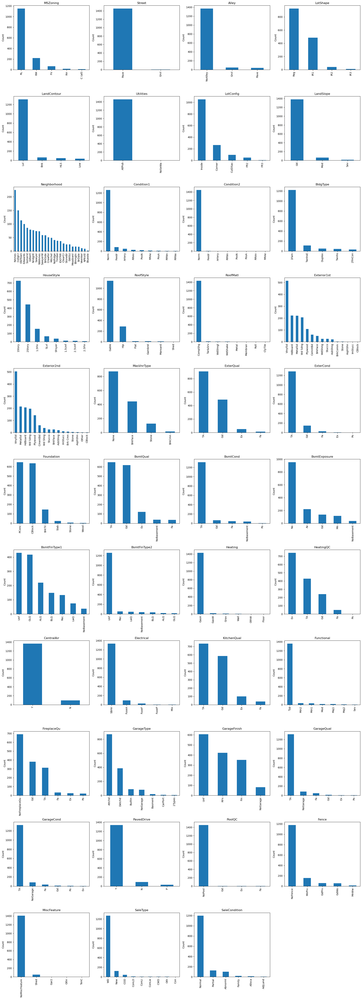

In [35]:
import matplotlib.pyplot as plt

# Select categorical columns
cat_cols = df.select_dtypes(include='object').columns

# Set up the subplot grid
n_cols = 4
n_rows = -(-len(cat_cols) // n_cols)  # Ceiling division
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()

# Plot each categorical column
for i, col in enumerate(cat_cols):
    df[col].value_counts().plot(kind='bar', ax=axes[i], title=col)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Count')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


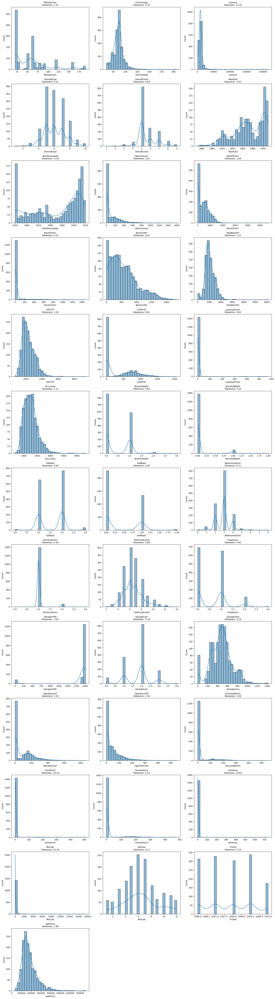

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew

# Select numerical columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Set up subplot grid
n_cols = 3
n_rows = -(-len(num_cols) // n_cols)  # Ceiling division
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
axes = axes.flatten()

# Plot hist + KDE and show skewness
for i, col in enumerate(num_cols):
    col_skew = skew(df[col].dropna())
    sns.histplot(df[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'{col}\nSkewness: {col_skew:.2f}', fontsize=10)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [37]:
# Import skew from scipy
from scipy.stats import skew

# Select only numerical features
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Compute skewness for each numerical column
skewness_values = df[numerical_cols].apply(lambda x: skew(x.dropna()))

# Sort by skewness for better readability (optional)
skewness_values = skewness_values.sort_values(ascending=False)

# Display the result
print(skewness_values)


MiscVal          24.451640
PoolArea         14.813135
LotArea          12.195142
3SsnPorch        10.293752
LowQualFinSF      9.002080
KitchenAbvGr      4.483784
BsmtFinSF2        4.250888
ScreenPorch       4.117977
BsmtHalfBath      4.099186
EnclosedPorch     3.086696
MasVnrArea        2.674865
OpenPorchSF       2.361912
LotFrontage       2.163805
SalePrice         1.880941
BsmtFinSF1        1.683771
WoodDeckSF        1.539792
TotalBsmtSF       1.522688
MSSubClass        1.406210
1stFlrSF          1.375342
GrLivArea         1.365156
BsmtUnfSF         0.919323
2ndFlrSF          0.812194
OverallCond       0.692355
TotRmsAbvGrd      0.675646
HalfBath          0.675203
Fireplaces        0.648898
BsmtFullBath      0.595454
OverallQual       0.216721
MoSold            0.211835
BedroomAbvGr      0.211572
GarageArea        0.179796
YrSold            0.096170
FullBath          0.036524
GarageCars       -0.342197
YearRemodAdd     -0.503044
YearBuilt        -0.612831
GarageYrBlt      -3.865524
d

In [38]:
# Bin LotArea into quartiles
df['LotArea_bin'] = pd.qcut(df['LotArea'], q=4, labels=['Small', 'Medium', 'Large', 'Very Large'])




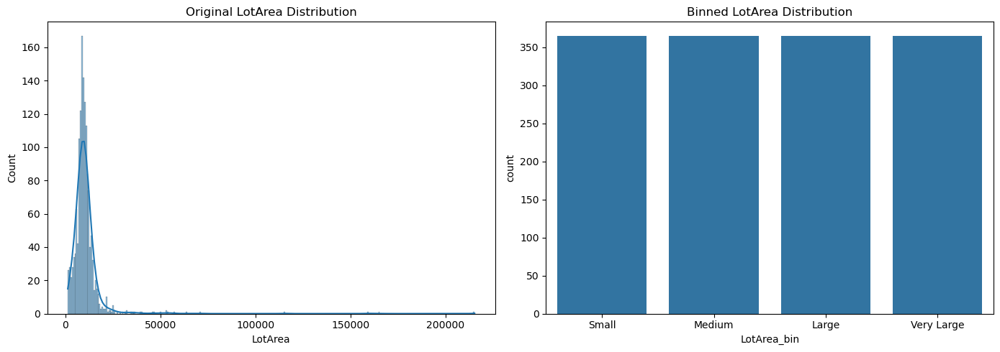

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.histplot(df['LotArea'], kde=True, ax=axes[0])
axes[0].set_title("Original LotArea Distribution")

sns.countplot(x='LotArea_bin', data=df, ax=axes[1])
axes[1].set_title("Binned LotArea Distribution")
plt.tight_layout()
plt.show()


In [40]:
df['YearBuilt_bin'] = pd.cut(
    df['YearBuilt'],
    bins=[1800, 1940, 1970, 2000, 2010],
    labels=['Old', 'Mid-Age', 'Modern', 'New']
)

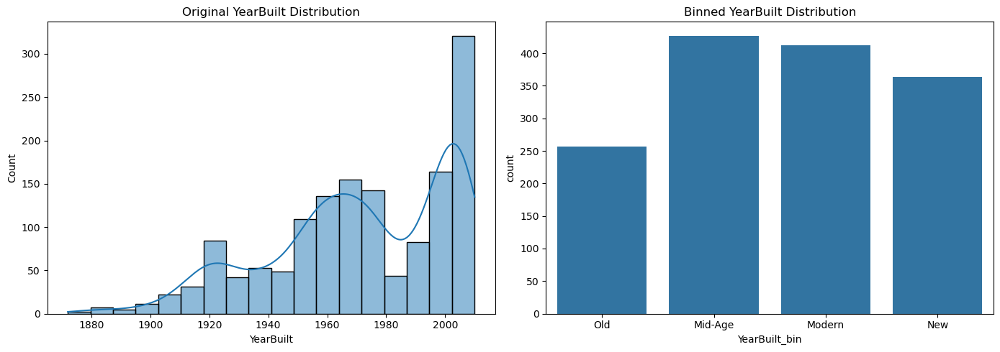

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Original distribution
sns.histplot(df['YearBuilt'], kde=True, ax=axes[0])
axes[0].set_title("Original YearBuilt Distribution")

# Binned category counts
sns.countplot(x='YearBuilt_bin', data=df, ax=axes[1], order=['Old', 'Mid-Age', 'Modern', 'New'])
axes[1].set_title("Binned YearBuilt Distribution")

plt.tight_layout()
plt.show()



In [42]:
# Select numerical features
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Compute skewness
skew_vals = df[num_cols].skew().sort_values(ascending=False)

# Filter for high skew
high_skew_cols = skew_vals[abs(skew_vals) > 1].index.tolist()
print("Highly skewed columns:\n", high_skew_cols)



Highly skewed columns:
 ['MiscVal', 'PoolArea', 'LotArea', '3SsnPorch', 'LowQualFinSF', 'KitchenAbvGr', 'BsmtFinSF2', 'ScreenPorch', 'BsmtHalfBath', 'EnclosedPorch', 'MasVnrArea', 'OpenPorchSF', 'LotFrontage', 'SalePrice', 'BsmtFinSF1', 'WoodDeckSF', 'TotalBsmtSF', 'MSSubClass', '1stFlrSF', 'GrLivArea', 'GarageYrBlt']


In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   int64   
 1   MSZoning       1460 non-null   object  
 2   LotFrontage    1460 non-null   float64 
 3   LotArea        1460 non-null   int64   
 4   Street         1460 non-null   object  
 5   Alley          1460 non-null   object  
 6   LotShape       1460 non-null   object  
 7   LandContour    1460 non-null   object  
 8   Utilities      1460 non-null   object  
 9   LotConfig      1460 non-null   object  
 10  LandSlope      1460 non-null   object  
 11  Neighborhood   1460 non-null   object  
 12  Condition1     1460 non-null   object  
 13  Condition2     1460 non-null   object  
 14  BldgType       1460 non-null   object  
 15  HouseStyle     1460 non-null   object  
 16  OverallQual    1460 non-null   int64   
 17  OverallCond    1460 non-null   in

In [44]:
# Log transform positive-only skewed features


for col in high_skew_cols:
    if (df[col] > 1).all():  # log1p only on positive data
        df[col + '_log'] = np.log1p(df[col])


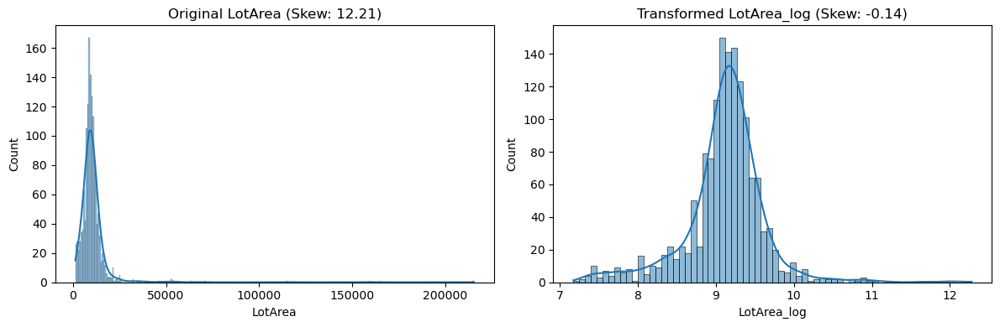

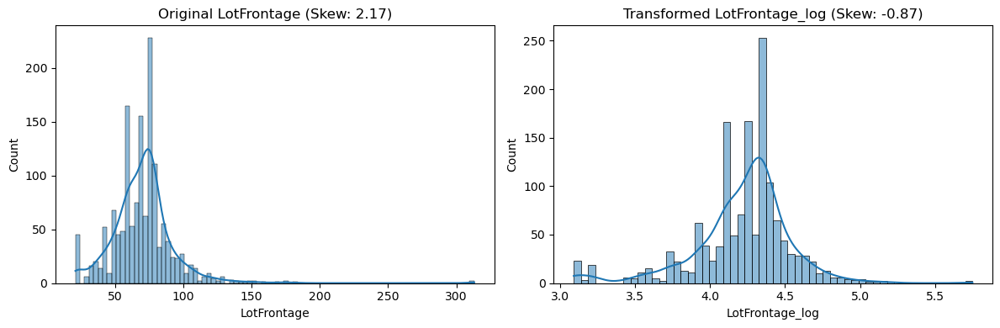

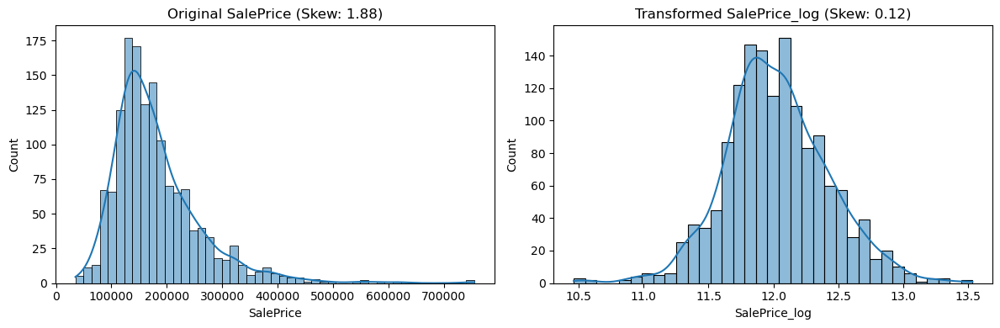

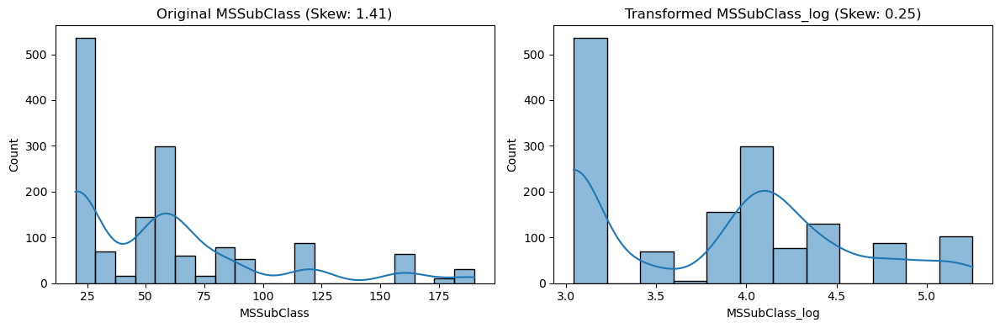

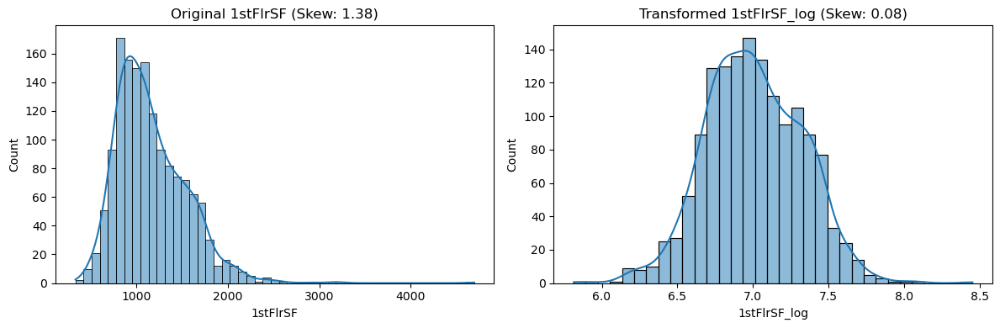

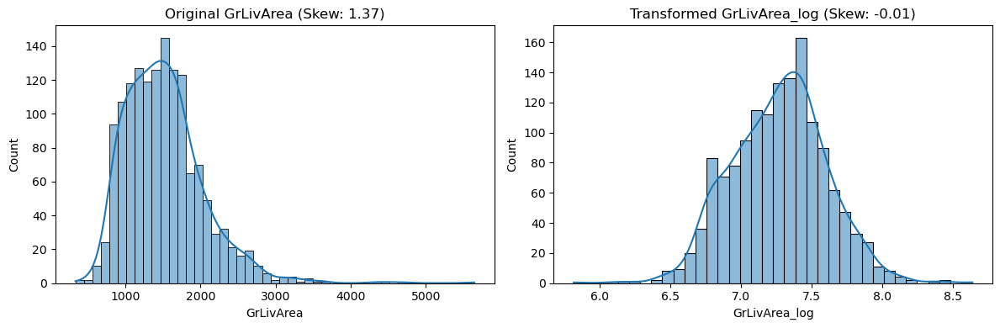

In [45]:


for col in high_skew_cols:
    if col + '_log' in df.columns:
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        sns.histplot(df[col], kde=True, ax=axes[0])
        axes[0].set_title(f'Original {col} (Skew: {df[col].skew():.2f})')

        sns.histplot(df[col + '_log'], kde=True, ax=axes[1])
        axes[1].set_title(f'Transformed {col}_log (Skew: {df[col + "_log"].skew():.2f})')
        plt.tight_layout()
        plt.show()


In [46]:
from sklearn.preprocessing import PowerTransformer

# Identify negatively skewed features
neg_skewed_cols = skew_vals[skew_vals < -1].index.tolist()
print("Negatively skewed features:", neg_skewed_cols)

# Initialize transformer
pt = PowerTransformer(method='yeo-johnson')

# Apply transformation
for col in neg_skewed_cols:
    reshaped = df[[col]].dropna()  # Drop NA to avoid errors
    transformed = pt.fit_transform(reshaped)
    df.loc[reshaped.index, col + '_yj'] = transformed


Negatively skewed features: ['GarageYrBlt']


In [47]:
for col in neg_skewed_cols:
    if col + '_yj' in df.columns:
        print(f"{col} → original skew: {df[col].skew():.2f} | transformed skew: {df[col + '_yj'].skew():.2f}")


GarageYrBlt → original skew: -3.87 | transformed skew: -3.79


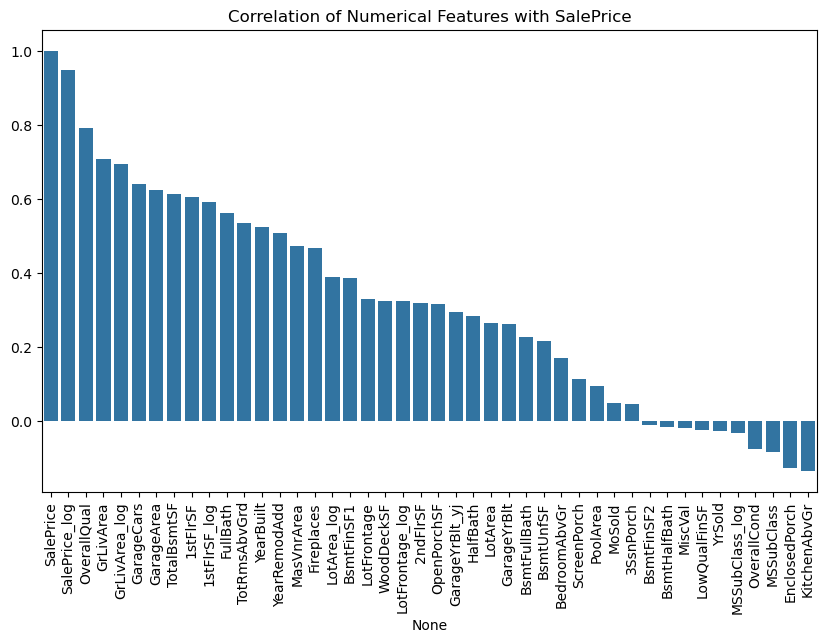

SalePrice          1.000000
SalePrice_log      0.948374
OverallQual        0.790982
GrLivArea          0.708624
GrLivArea_log      0.695147
GarageCars         0.640409
GarageArea         0.623431
TotalBsmtSF        0.613581
1stFlrSF           0.605852
1stFlrSF_log       0.591299
FullBath           0.560664
TotRmsAbvGrd       0.533723
YearBuilt          0.522897
YearRemodAdd       0.507101
MasVnrArea         0.472614
Fireplaces         0.466929
LotArea_log        0.388528
BsmtFinSF1         0.386420
LotFrontage        0.328989
WoodDeckSF         0.324413
LotFrontage_log    0.323760
2ndFlrSF           0.319334
OpenPorchSF        0.315856
GarageYrBlt_yj     0.292720
HalfBath           0.284108
LotArea            0.263843
GarageYrBlt        0.261366
BsmtFullBath       0.227122
BsmtUnfSF          0.214479
BedroomAbvGr       0.168213
ScreenPorch        0.111447
PoolArea           0.092404
MoSold             0.046432
3SsnPorch          0.044584
BsmtFinSF2        -0.011378
BsmtHalfBath      -0

In [48]:

from scipy.stats import f_oneway

# 1. Numerical Correlation with SalePrice
numerical_features = df.select_dtypes(include=['number']).columns
corr_matrix = df[numerical_features].corr()

# Correlation with SalePrice
saleprice_corr = corr_matrix['SalePrice'].sort_values(ascending=False)

# Plotting Correlation with SalePrice
plt.figure(figsize=(10, 6))
sns.barplot(x=saleprice_corr.index, y=saleprice_corr.values)
plt.xticks(rotation=90)
plt.title("Correlation of Numerical Features with SalePrice")
plt.show()

# Print Correlation values for numerical features
print(saleprice_corr)



In [49]:
from scipy.stats import kruskal

# 2. Categorical Correlation with SalePrice (Kruskal-Wallis Test for each categorical feature)
categorical_features = df.select_dtypes(include=['object']).columns
for feature in categorical_features:
    if df[feature].nunique() > 1:  # Ensure feature has more than one category
        groups = [df[df[feature] == category]['SalePrice'].dropna() for category in df[feature].unique()]
        if len(groups) > 1:
            h_stat, p_value = kruskal(*groups)
            print(f"Kruskal-Wallis Test for {feature} - p-value: {p_value}")
            
            # Check significance
            if p_value < 0.05:
                print(f"Result: The test is significant (p-value < 0.05).")
            else:
                print(f"Result: The test is NOTsignificant(p-value>=0.05).")
        else:
            print(f"Kruskal-Wallis Test for {feature} - Only one group found, skipping")
    else:
        print(f"Kruskal-Wallis Test for {feature} - Not enough unique categories, skipping")


Kruskal-Wallis Test for MSZoning - p-value: 3.0807239995999556e-57
Result: The test is significant (p-value < 0.05).
Kruskal-Wallis Test for Street - p-value: 0.08012555757743882
Result: The test is NOTsignificant(p-value>=0.05).
Kruskal-Wallis Test for Alley - p-value: 1.184056173794853e-10
Result: The test is significant (p-value < 0.05).
Kruskal-Wallis Test for LotShape - p-value: 1.6403232738441862e-32
Result: The test is significant (p-value < 0.05).
Kruskal-Wallis Test for LandContour - p-value: 1.0479232964716677e-07
Result: The test is significant (p-value < 0.05).
Kruskal-Wallis Test for Utilities - p-value: 0.5233079667064577
Result: The test is NOTsignificant(p-value>=0.05).
Kruskal-Wallis Test for LotConfig - p-value: 3.297912123318503e-07
Result: The test is significant (p-value < 0.05).
Kruskal-Wallis Test for LandSlope - p-value: 0.13953796431157062
Result: The test is NOTsignificant(p-value>=0.05).
Kruskal-Wallis Test for Neighborhood - p-value: 6.696799031736196e-168
R

In [50]:
import pandas as pd
import numpy as np

# Create encoded copies (non-inplace)
lotarea_bin_encoded = df['LotArea_bin'].astype('category').cat.codes
yearbuilt_bin_encoded = df['YearBuilt_bin'].astype('category').cat.codes

# Create a temporary DataFrame for correlation
corr_df = pd.DataFrame({
    'LotArea': df['LotArea'],
    'LotArea_bin_encoded': lotarea_bin_encoded,
    'YearBuilt': df['YearBuilt'],
    'YearBuilt_bin_encoded': yearbuilt_bin_encoded,
    'SalePrice': df['SalePrice']
})

# Compute correlation
correlation = corr_df.corr()

# Print the result
print(correlation)



                        LotArea  LotArea_bin_encoded  YearBuilt  \
LotArea                1.000000             0.443290   0.014228   
LotArea_bin_encoded    0.443290             1.000000   0.132446   
YearBuilt              0.014228             0.132446   1.000000   
YearBuilt_bin_encoded -0.000874             0.117080   0.944187   
SalePrice              0.263843             0.435234   0.522897   

                       YearBuilt_bin_encoded  SalePrice  
LotArea                            -0.000874   0.263843  
LotArea_bin_encoded                 0.117080   0.435234  
YearBuilt                           0.944187   0.522897  
YearBuilt_bin_encoded               1.000000   0.522432  
SalePrice                           0.522432   1.000000  


In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 89 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   MSSubClass       1460 non-null   int64   
 1   MSZoning         1460 non-null   object  
 2   LotFrontage      1460 non-null   float64 
 3   LotArea          1460 non-null   int64   
 4   Street           1460 non-null   object  
 5   Alley            1460 non-null   object  
 6   LotShape         1460 non-null   object  
 7   LandContour      1460 non-null   object  
 8   Utilities        1460 non-null   object  
 9   LotConfig        1460 non-null   object  
 10  LandSlope        1460 non-null   object  
 11  Neighborhood     1460 non-null   object  
 12  Condition1       1460 non-null   object  
 13  Condition2       1460 non-null   object  
 14  BldgType         1460 non-null   object  
 15  HouseStyle       1460 non-null   object  
 16  OverallQual      1460 non-null   int64   


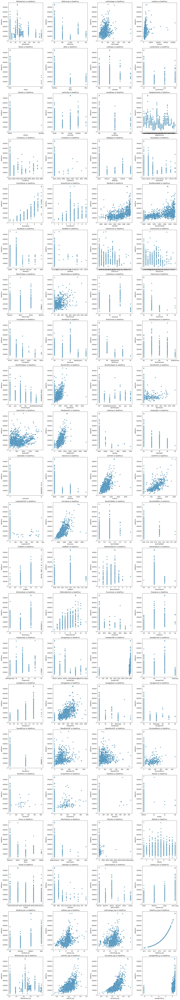

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get all feature names excluding 'SalePrice'
features_to_plot = [col for col in df.columns if col != 'SalePrice']

# Set up the matplotlib figure (4 plots per row)
n_cols = 4
n_rows = (len(features_to_plot) + n_cols - 1) // n_cols  # Calculate the number of rows needed

plt.figure(figsize=(20, n_rows * 5))

# Create scatter plots for each feature
for i, feature in enumerate(features_to_plot, 1):
    plt.subplot(n_rows, n_cols, i)  # n_rows rows, n_cols columns, i-th plot
    sns.scatterplot(x=df[feature], y=df['SalePrice'])
    plt.title(f'{feature} vs SalePrice')
    plt.xlabel(feature)
    plt.ylabel('SalePrice')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()


In [53]:
'''
# Define the function to add new features and drop the originals
def add_features(df):
    # Copy the dataframe to avoid modifying the original
    df = df.copy()
    
    # Total square footage
    df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
    
    # Total bathrooms
    df['TotalBathrooms'] = df['FullBath'] + (0.5 * df['HalfBath']) + \
                           df['BsmtFullBath'] + (0.5 * df['BsmtHalfBath'])
    
    # House age when sold
    df['HouseAge'] = df['YrSold'] - df['YearBuilt']
    
    # Whether the house has been remodeled
    df['Remodeled'] = (df['YearRemodAdd'] != df['YearBuilt']).astype(int)
    
    # Drop the original features
   #df.drop(columns=['TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'FullBath', 'HalfBath', 
                    #'BsmtFullBath', 'BsmtHalfBath', 'YrSold', 'YearBuilt', 'YearRemodAdd'], inplace=True)
    
    return df

# Apply the function to the dataframe
df = add_features(df)'''


"\n# Define the function to add new features and drop the originals\ndef add_features(df):\n    # Copy the dataframe to avoid modifying the original\n    df = df.copy()\n    \n    # Total square footage\n    df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']\n    \n    # Total bathrooms\n    df['TotalBathrooms'] = df['FullBath'] + (0.5 * df['HalfBath']) +                            df['BsmtFullBath'] + (0.5 * df['BsmtHalfBath'])\n    \n    # House age when sold\n    df['HouseAge'] = df['YrSold'] - df['YearBuilt']\n    \n    # Whether the house has been remodeled\n    df['Remodeled'] = (df['YearRemodAdd'] != df['YearBuilt']).astype(int)\n    \n    # Drop the original features\n   #df.drop(columns=['TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'FullBath', 'HalfBath', \n                    #'BsmtFullBath', 'BsmtHalfBath', 'YrSold', 'YearBuilt', 'YearRemodAdd'], inplace=True)\n    \n    return df\n\n# Apply the function to the dataframe\ndf = add_features(df)"

In [54]:
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold

# Initialize KFold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Create a list to hold all frequency encoded column names
frequency_encoded_columns = []

# Loop through each categorical column and apply frequency encoding
for feature in categorical_features:
    if df[feature].nunique() > 1:  # Ensure feature has more than one category
        frequency_encoded = np.zeros(df.shape[0])  # Array to hold the frequency encoded values
        
        # Cross-validation loop for encoding
        for train_idx, val_idx in kf.split(df):
            train, val = df.iloc[train_idx], df.iloc[val_idx]
            
            # Compute the frequency (count) of each category in the training set
            category_counts = train[feature].value_counts()
            
            # Map the frequency values to the validation set
            val_encoded = val[feature].map(category_counts)
            frequency_encoded[val_idx] = val_encoded
        
        # New column name
        new_col = 'FrequencyEncoded_' + feature
        df[new_col] = frequency_encoded
        frequency_encoded_columns.append(new_col)

# Drop original categorical columns after encoding
df.drop(columns=categorical_features, inplace=True)


In [55]:
df['TotalSF'] = df['1stFlrSF'] + df['2ndFlrSF'] + df['GrLivArea']

df.drop(columns=['1stFlrSF', '2ndFlrSF', 'GrLivArea'], inplace=True)


In [56]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler

# Create a scaler instance
scaler = StandardScaler()

# Exclude the target variable
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns
features_to_scale = numerical_features.drop('SalePrice')

# Standardize the selected numerical features
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

# Or for Min-Max scaling
# scaler = MinMaxScaler()
# df[numerical_features] = scaler.fit_transform(df[numerical_features])


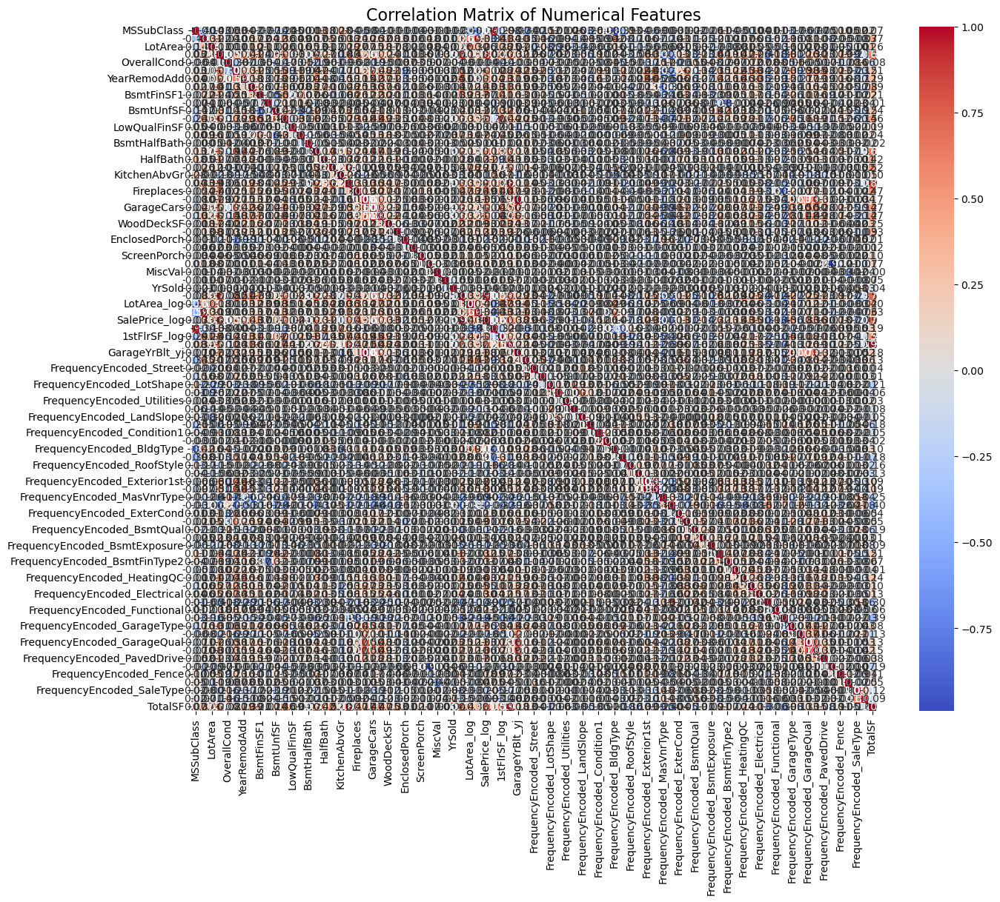

In [57]:
# Select only numerical columns (excluding object, category, etc.)
numeric_df = df.select_dtypes(include=['int64', 'float64'])

# Now compute the correlation matrix
correlation_matrix = numeric_df.corr()

# Optional: plot it
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=0.5)
plt.title("Correlation Matrix of Numerical Features", fontsize=16)
plt.show()



In [58]:


# Original numerical features that were transformed
to_drop=[
    'LotArea',           # you kept LotArea_bin
    'LotArea_log',       # redundant if bin performs better
    'LotFrontage',
   #'YearBuilt',         # you kept YearBuilt_bin
    'MSSubClass',        
    '1stFlrSF_log',
    'GrLivArea_log',
    'GarageYrBlt_yj'
   
]

df.drop(columns=[col for col in to_drop if col in df.columns], inplace=True)


In [59]:
df.drop('SalePrice_log', axis=1, inplace=True)


In [60]:
# Create Sale_Range using quantiles
df['Sale_Range'] = pd.qcut(df['SalePrice'], q=3, labels=['low', 'mid', 'high'])

In [61]:
print(df['Sale_Range'].value_counts())

Sale_Range
mid     490
low     487
high    483
Name: count, dtype: int64


In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   OverallQual                     1460 non-null   float64 
 1   OverallCond                     1460 non-null   float64 
 2   YearBuilt                       1460 non-null   float64 
 3   YearRemodAdd                    1460 non-null   float64 
 4   MasVnrArea                      1460 non-null   float64 
 5   BsmtFinSF1                      1460 non-null   float64 
 6   BsmtFinSF2                      1460 non-null   float64 
 7   BsmtUnfSF                       1460 non-null   float64 
 8   TotalBsmtSF                     1460 non-null   float64 
 9   LowQualFinSF                    1460 non-null   float64 
 10  BsmtFullBath                    1460 non-null   float64 
 11  BsmtHalfBath                    1460 non-null   float64 
 12  FullBath            

In [63]:



# Step 1: Get correlation matrix
numeric_df = df.select_dtypes(include=['int64', 'float64'])
corr_matrix = numeric_df.corr().abs()  # absolute correlation values

# Step 2: Mask the lower triangle and self-correlations
upper = corr_matrix.where(~np.tril(np.ones(corr_matrix.shape)).astype(bool))

# Step 3: Filter and print pairs with correlation > 0.8
high_corr = upper.stack()[upper.stack() > 0.8].sort_values(ascending=False)

print("Highly correlated variable pairs (correlation > 0.8):\n")
for (var1, var2), corr_val in high_corr.items():
    print(f"{var1} & {var2}: {corr_val:.3f}")


Highly correlated variable pairs (correlation > 0.8):

PoolArea & FrequencyEncoded_PoolQC: 0.990
FrequencyEncoded_Exterior1st & FrequencyEncoded_Exterior2nd: 0.951
GarageCars & GarageArea: 0.882
Fireplaces & FrequencyEncoded_FireplaceQu: 0.836
TotRmsAbvGrd & TotalSF: 0.824


In [64]:
df['TotalLivingSpace'] = df['TotRmsAbvGrd'] + df['TotalSF']
# Drop the original features if needed
df.drop(columns=['TotRmsAbvGrd', 'TotalSF'], inplace=True)


In [65]:
# Drop 'PoolArea' feature
df.drop(columns=['PoolArea','FrequencyEncoded_Exterior2nd'] , inplace=True)



In [66]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler

# Create a scaler instance
scaler = StandardScaler()

# Exclude the target variable
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns
features_to_scale = numerical_features.drop('SalePrice')

# Standardize the selected numerical features
df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

# Or for Min-Max scaling
# scaler = MinMaxScaler()
# df[numerical_features] = scaler.fit_transform(df[numerical_features])


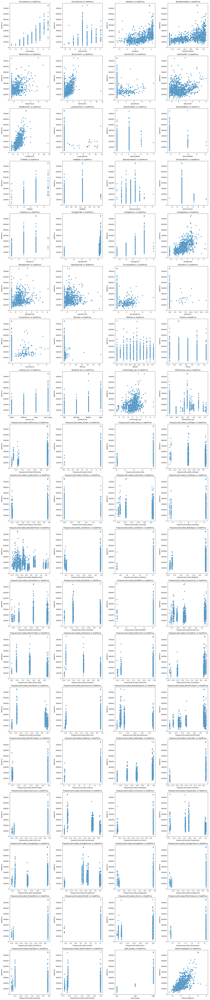

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get all feature names excluding 'SalePrice'
features_to_plot = [col for col in df.columns if col != 'SalePrice']

# Set up the matplotlib figure (4 plots per row)
n_cols = 4
n_rows = (len(features_to_plot) + n_cols - 1) // n_cols  # Calculate the number of rows needed

plt.figure(figsize=(20, n_rows * 5))

# Create scatter plots for each feature
for i, feature in enumerate(features_to_plot, 1):
    plt.subplot(n_rows, n_cols, i)  # n_rows rows, n_cols columns, i-th plot
    sns.scatterplot(x=df[feature], y=df['SalePrice'])
    plt.title(f'{feature} vs SalePrice')
    plt.xlabel(feature)
    plt.ylabel('SalePrice')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()


In [68]:
# Perform One-Hot Encoding for LotArea_bin and YearBuilt_bin
df = pd.get_dummies(df, columns=['LotArea_bin', 'YearBuilt_bin'], drop_first=False)

# Now your dataframe has new one-hot encoded columns for the binned features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 83 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   OverallQual                     1460 non-null   float64 
 1   OverallCond                     1460 non-null   float64 
 2   YearBuilt                       1460 non-null   float64 
 3   YearRemodAdd                    1460 non-null   float64 
 4   MasVnrArea                      1460 non-null   float64 
 5   BsmtFinSF1                      1460 non-null   float64 
 6   BsmtFinSF2                      1460 non-null   float64 
 7   BsmtUnfSF                       1460 non-null   float64 
 8   TotalBsmtSF                     1460 non-null   float64 
 9   LowQualFinSF                    1460 non-null   float64 
 10  BsmtFullBath                    1460 non-null   float64 
 11  BsmtHalfBath                    1460 non-null   float64 
 12  FullBath            

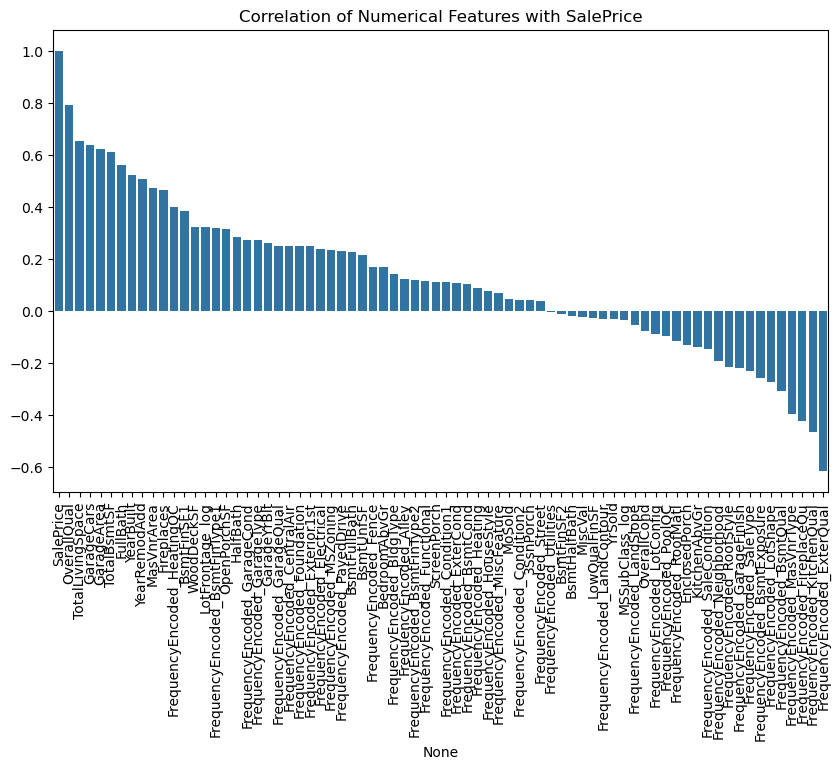

In [69]:

from scipy.stats import f_oneway

# 1. Numerical Correlation with SalePrice
numerical_features = df.select_dtypes(include=['number']).columns
corr_matrix = df[numerical_features].corr()

# Correlation with SalePrice
saleprice_corr = corr_matrix['SalePrice'].sort_values(ascending=False)

# Plotting Correlation with SalePrice
plt.figure(figsize=(10, 6))
sns.barplot(x=saleprice_corr.index, y=saleprice_corr.values)
plt.xticks(rotation=90)
plt.title("Correlation of Numerical Features with SalePrice")
plt.show()

# Print Correlation values for numerical features




In [70]:
# List of basement-related features
bsmt_features = [col for col in df.columns if 'Bsmt' in col]

# Select basement-related features along with SalePrice
bsmt_features.append('SalePrice')  # Add 'SalePrice' for correlation

# Calculate the correlation matrix
corr_matrix = df[bsmt_features].corr()

# Display the correlation with SalePrice
correlation_with_saleprice = corr_matrix['SalePrice'].sort_values(ascending=False)

# Print the results
print(correlation_with_saleprice)


SalePrice                        1.000000
TotalBsmtSF                      0.613581
BsmtFinSF1                       0.386420
FrequencyEncoded_BsmtFinType1    0.320303
BsmtFullBath                     0.227122
BsmtUnfSF                        0.214479
FrequencyEncoded_BsmtFinType2    0.120643
FrequencyEncoded_BsmtCond        0.103568
BsmtFinSF2                      -0.011378
BsmtHalfBath                    -0.016844
FrequencyEncoded_BsmtExposure   -0.255207
FrequencyEncoded_BsmtQual       -0.307770
Name: SalePrice, dtype: float64


### Task 4 ###

In [71]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score


Random Forest Regressor Performance:
R² Score: 0.8767
RMSE: 30748.23

XGBoost Regressor Performance:
R² Score: 0.8889
RMSE: 29195.83


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


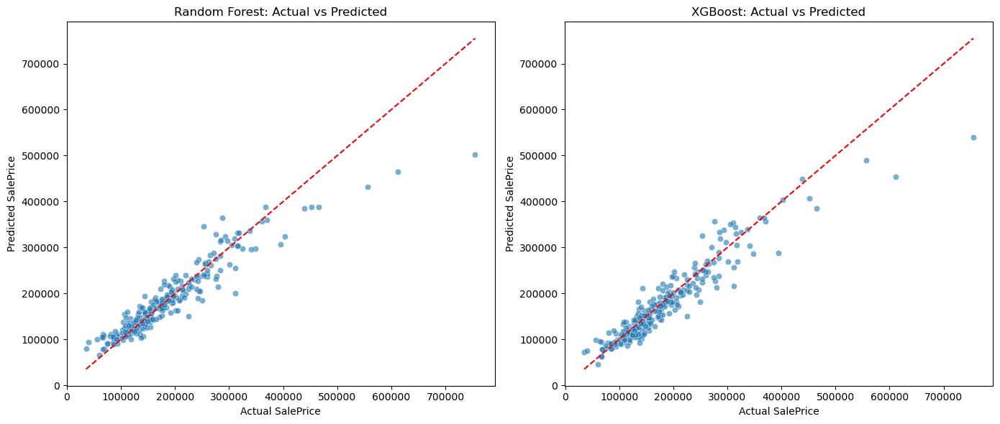

In [72]:

# Features for regression (exclude classification target and SalePrice itself)
X_reg = df.drop(columns=['SalePrice', 'Sale_Range'])
y_reg = df['SalePrice']

# Split the data
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_reg, y_reg, test_size=0.2, random_state=42
)

# Random Forest Regressor
rf_reg = RandomForestRegressor(random_state=42)
rf_reg.fit(X_train_reg, y_train_reg)
y_pred_rf = rf_reg.predict(X_test_reg)

# Evaluate Random Forest
print("Random Forest Regressor Performance:")
r2_rf = r2_score(y_test_reg, y_pred_rf)
rmse_rf = mean_squared_error(y_test_reg, y_pred_rf, squared=False)
print(f"R² Score: {r2_rf:.4f}")
print(f"RMSE: {rmse_rf:.2f}")

# XGBoost Regressor
xgb_reg = XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1, max_depth=3)
xgb_reg.fit(X_train_reg, y_train_reg)
y_pred_xgb = xgb_reg.predict(X_test_reg)

# Evaluate XGBoost
print("\nXGBoost Regressor Performance:")
r2_xgb = r2_score(y_test_reg, y_pred_xgb)
rmse_xgb = mean_squared_error(y_test_reg, y_pred_xgb, squared=False)
print(f"R² Score: {r2_xgb:.4f}")
print(f"RMSE: {rmse_xgb:.2f}")

# Create comparison DataFrame
comparison_df = pd.DataFrame({
    'Actual': y_test_reg.values,
    'Random Forest Prediction': y_pred_rf,
    'XGBoost Prediction': y_pred_xgb
})

# Plot results
plt.figure(figsize=(14, 6))

# Subplot 1: Random Forest
plt.subplot(1, 2, 1)
sns.scatterplot(x='Actual', y='Random Forest Prediction', data=comparison_df, alpha=0.6)
plt.plot([comparison_df['Actual'].min(), comparison_df['Actual'].max()],
         [comparison_df['Actual'].min(), comparison_df['Actual'].max()],
         color='red', linestyle='--')
plt.title('Random Forest: Actual vs Predicted')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')

# Subplot 2: XGBoost
plt.subplot(1, 2, 2)
sns.scatterplot(x='Actual', y='XGBoost Prediction', data=comparison_df, alpha=0.6)
plt.plot([comparison_df['Actual'].min(), comparison_df['Actual'].max()],
         [comparison_df['Actual'].min(), comparison_df['Actual'].max()],
         color='red', linestyle='--')
plt.title('XGBoost: Actual vs Predicted')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')

plt.tight_layout()
plt.show()

In [73]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

mse_rf = mean_squared_error(y_test_reg, y_pred_rf)
mae_rf = mean_absolute_error(y_test_reg, y_pred_rf)

print("Random Forest Regressor:")
print(f"MSE: {mse_rf:.2f}")
print(f"MAE: {mae_rf:.2f}")

Random Forest Regressor:
MSE: 945453770.21
MAE: 18760.88


In [74]:
mse_xgb = mean_squared_error(y_test_reg, y_pred_xgb)
mae_xgb = mean_absolute_error(y_test_reg, y_pred_xgb)

print("XGBoost Regressor:")
print(f"MSE: {mse_xgb:.2f}")
print(f"MAE: {mae_xgb:.2f}")

XGBoost Regressor:
MSE: 852396523.62
MAE: 19021.37
